In [12]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

from scipy.ndimage.interpolation import zoom
from PIL import Image
#from scipy.misc import imsave
import glob
from os.path import basename
#from scipy.misc import imresize
from skimage.transform import resize

from keras import Model
from keras.models import load_model
from keras.layers import Conv2D, Input, Dense,Flatten,LeakyReLU, BatchNormalization
from keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping
from keras import backend as K
import tensorflow as tf
import keras
print(K.backend())

from image_helper import *
from MyDataGenerator import DataGenerator


tensorflow


ImportError: cannot import name 'imresize'

# Load Data

In [5]:
#augmented_train_data, augmented_train_label = load_augmented_data("./augmented_data/", "train")
augmented_validation_data, augmented_validation_label = load_augmented_data("./augmented_data/", "val")



partition_dict, labels_dict = get_generator_dicts("./augmented_data/")

NameError: name 'load_augmented_data' is not defined

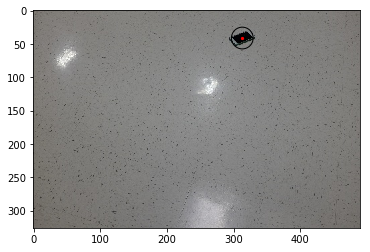

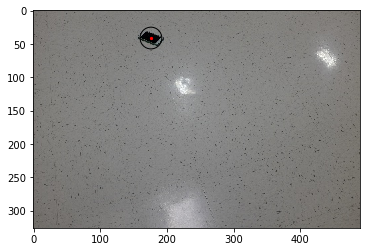

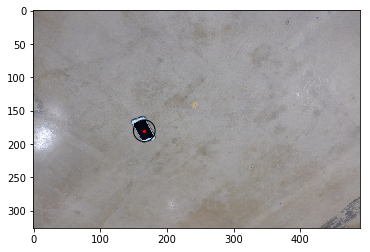

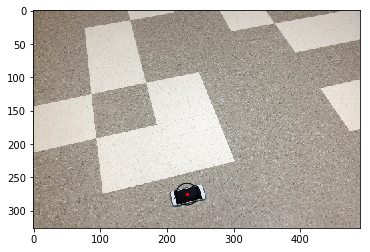

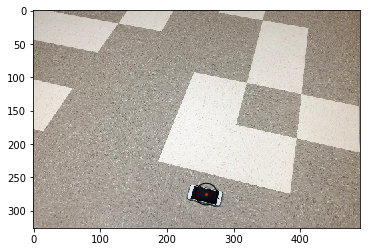

...

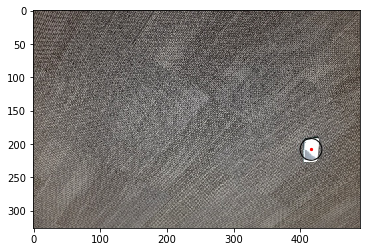

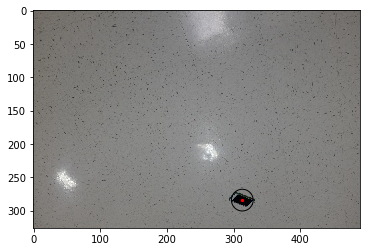

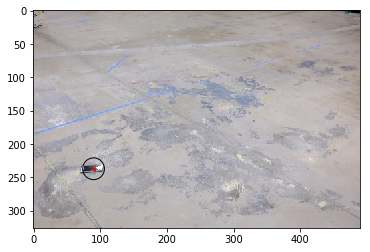

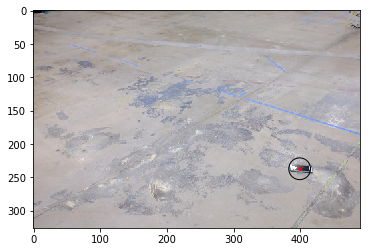

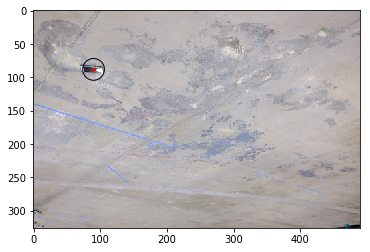

In [5]:
for i, im_ in enumerate(augmented_validation_data[:20]):
    plot_with_label(im_, augmented_validation_label[i][0], augmented_validation_label[i][1])

In [3]:
resize_factor = 0.6
augmented_train_data_resized = np.zeros((augmented_train_data.shape[0], imresize(augmented_train_data[0], resize_factor).shape[0], imresize(augmented_train_data[0], resize_factor).shape[1], 3))
augmented_validation_data_resized = np.zeros((augmented_validation_data.shape[0], imresize(augmented_validation_data[0], resize_factor).shape[0], imresize(augmented_validation_data[0], resize_factor).shape[1], 3))
#augmented_train_data_resized_ = np.zeros((augmented_train_data.shape[0], imresize(augmented_train_data[0], resize_factor).shape[0], imresize(augmented_train_data[0], resize_factor).shape[1], 3))
#augmented_validation_data_resized_ = np.zeros((augmented_validation_data.shape[0], imresize(augmented_validation_data[0], resize_factor).shape[0], imresize(augmented_validation_data[0], resize_factor).shape[1], 3))


for i, im in enumerate(augmented_train_data):
    augmented_train_data_resized[i] = imresize(im, resize_factor)/255
    #augmented_train_data_resized_[i] = resize(im, (augmented_train_data_resized[i].shape[0],augmented_train_data_resized[i].shape[1]))
    

for i, im in enumerate(augmented_validation_data):
    augmented_validation_data_resized[i] = imresize(im, resize_factor)/255
    #augmented_validation_data_resized_[i] = resize(im, (augmented_train_data_resized[i].shape[0],augmented_train_data_resized[i].shape[1]))
    
augmented_train_data = augmented_train_data_resized
augmented_validation_data = augmented_validation_data_resized

C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  
C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  if __name__ == '__main__':
C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform

# Model

In [2]:
tbCallBack = TensorBoard(log_dir='./logs/regression', histogram_freq=2, batch_size=32, write_graph=True, write_grads=True, write_images=True)
cpCallBack = ModelCheckpoint('./checkpoints/regression/best_model.hdf5', monitor='val_loss', verbose=0, save_best_only=True, save_weights_only=False, mode='auto', period=1)
esCallBack = EarlyStopping(monitor='val_loss', min_delta=0, patience=6, verbose=0, mode='auto')

K.clear_session()
sess = tf.Session()
K.set_session(sess)

In [4]:
input_img = Input(shape=(195, 294, 3))

# No Batch normalization, as it seemed to cause less good generalization
x = Conv2D(16, (3, 3), padding='same')(input_img)
x = LeakyReLU(alpha=0.3)(x)
x = Conv2D(16, (3, 3), padding='same')(x)
x = LeakyReLU(alpha=0.3)(x)
x = Conv2D(16, (3, 3), padding='same')(x)
x = LeakyReLU(alpha=0.3)(x)
x = Conv2D(1, (1, 1), padding='same')(x)
x = LeakyReLU(alpha=0.3)(x)
x = Flatten()(x)

# Set bias to false in this layer. This prevents network from learning local minima: "always predict mean (x=y=0.5)" 
# by learning all weights to become 0 except bias weight to 0.5
output = Dense(2, use_bias=False)(x)

model = Model(inputs=input_img, outputs=output)

from keras import optimizers
model.compile(optimizer="adam", loss='mean_squared_error')

print(model.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 195, 294, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 195, 294, 16)      448       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 195, 294, 16)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 195, 294, 16)      2320      
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 195, 294, 16)      0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 195, 294, 16)      2320      
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 195, 294, 16)      0         
__________

In [15]:
params = {'dim': (195, 294),
          'batch_size': 32,
          'n_channels': 3,
          'shuffle': True}
training_generator = DataGenerator("./augmented_data/", partition_dict['train'], labels_dict, **params)
validation_generator = DataGenerator("./augmented_data/", partition_dict['val'], labels_dict, **params)

history = model.fit_generator(generator=training_generator, validation_data=validation_generator, epochs=30, callbacks=[cpCallBack, esCallBack])


#history = model.fit(augmented_train_data, augmented_train_label, validation_data=[augmented_validation_data, augmented_validation_label] ,epochs=20, batch_size=32, callbacks=[tbCallBack, cpCallBack, esCallBack])

Epoch 1/30
425/425 [==============================] - 1669s 4s/step - loss: 0.0716 - val_loss: 0.0562
Epoch 2/30
  6/425 [..............................] - ETA: 26:49 - loss: 0.0731

KeyboardInterrupt: 

In [14]:
predictions = model.predict(augmented_train_data)
print(predictions)
for i, pred in enumerate(predictions):
    plot_with_label(augmented_train_data_resized[i], pred[0], pred[1])

NameError: name 'augmented_train_data' is not defined

In [12]:
predictions = model.predict(augmented_validation_data_resized)
for i, pred in enumerate(predictions):
    plot_with_label(augmented_validation_data_resized[i], pred[0], pred[1])

NameError: name 'augmented_validation_data_resized' is not defined

In [24]:
model = load_model("./checkpoints/regression/best_model.hdf5")

0.23877239 0.6012436


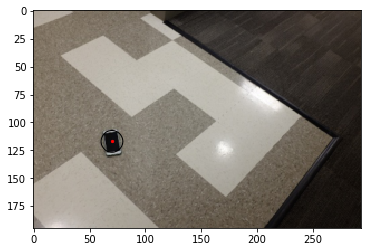

0.7611266 0.6012105


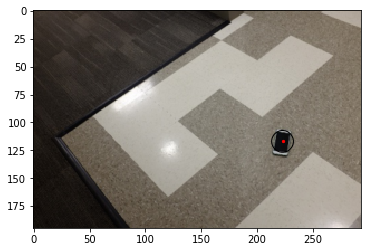

0.7123335 0.2883038


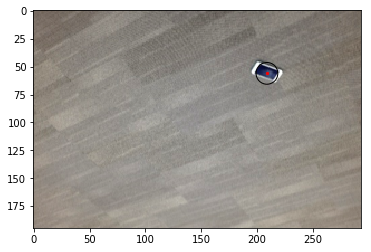

0.693785 0.2975887


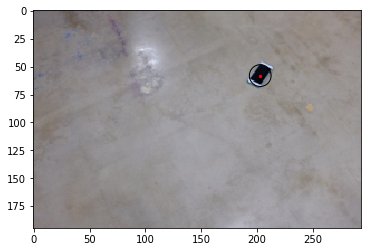

0.30611566 0.29747844


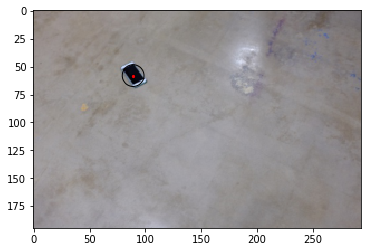

0.6937965 0.70247334


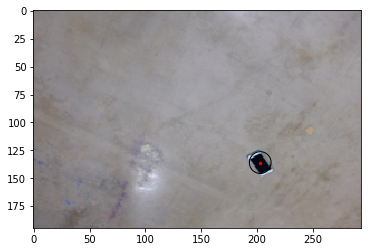

0.30601528 0.7025778


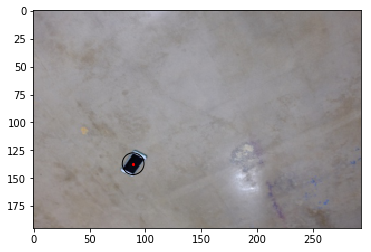

0.28774908 0.28823894


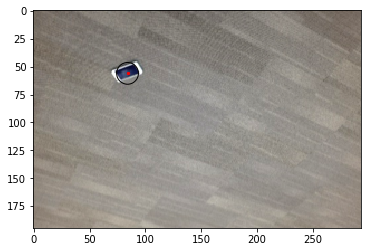

0.5286641 0.48765472


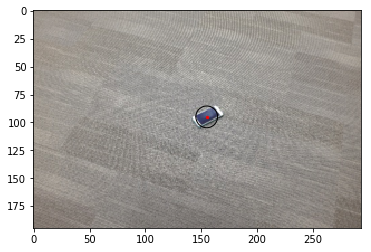

0.47143203 0.4876824


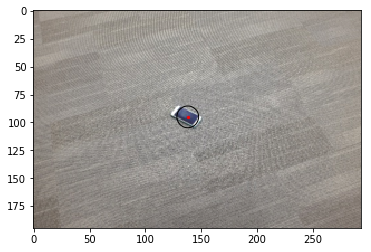

0.5285583 0.5122643


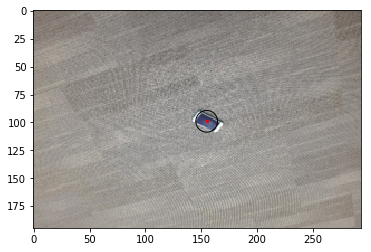

0.47133702 0.5123004


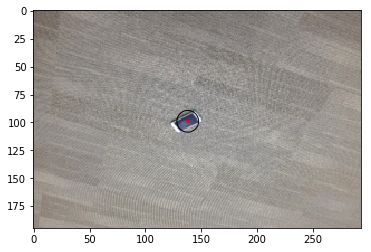

0.7684036 0.3255427


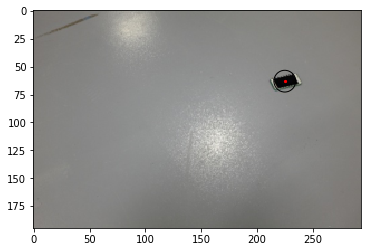

0.23074076 0.32590166


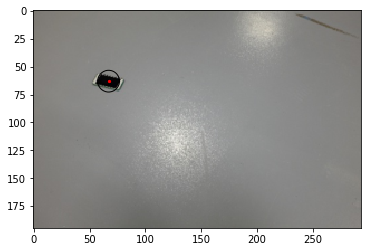

0.7698509 0.6740267


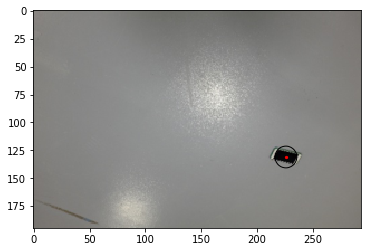

0.22956726 0.6741705


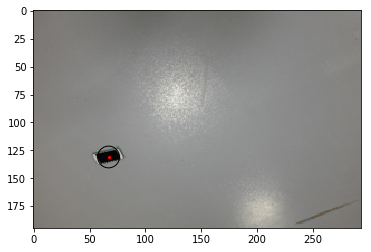

0.2389135 0.39878216


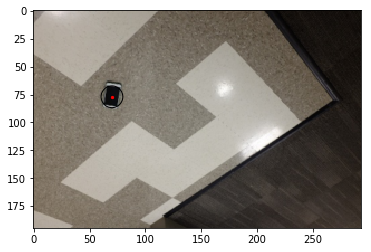

0.112173155 0.3465594


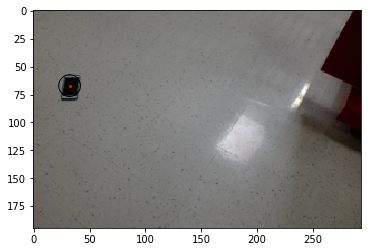

0.8876474 0.34655324


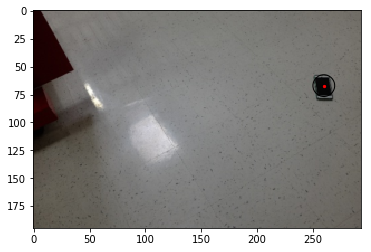

0.11219624 0.6533365


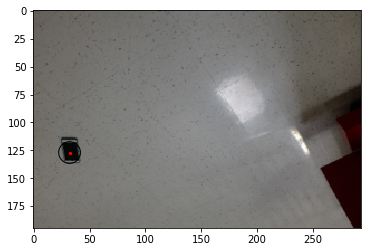

0.8874912 0.65346456


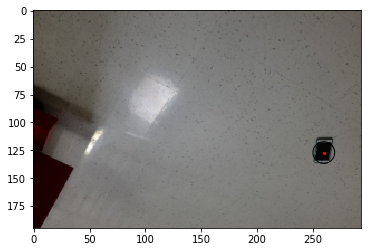

0.84487545 0.15637505


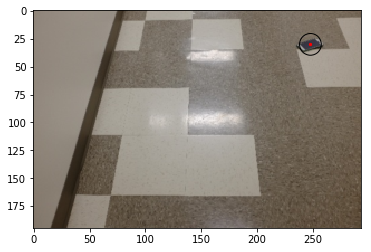

0.1549857 0.15637839


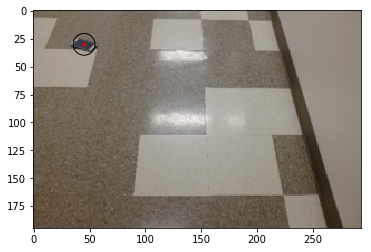

0.84491974 0.8436073


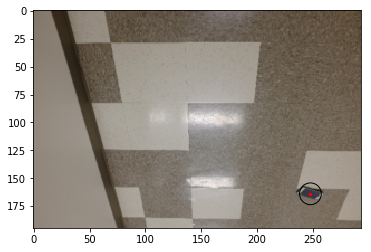

0.15496118 0.8435104


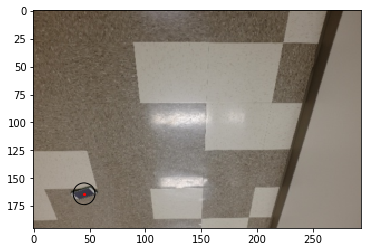

0.48362628 0.45094684


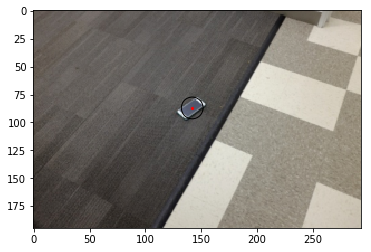

0.5162404 0.4509729


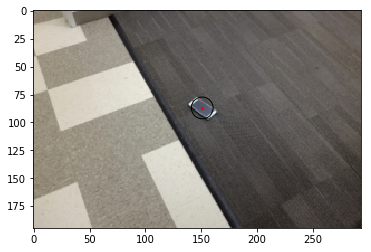

0.761017 0.39878872


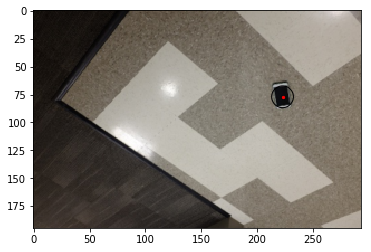

0.48362395 0.5490238


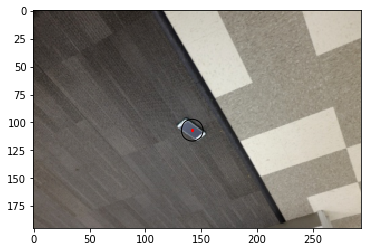

0.51627684 0.5490121


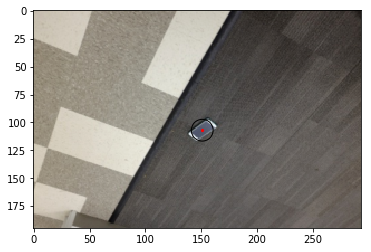

0.26128668 0.80373716


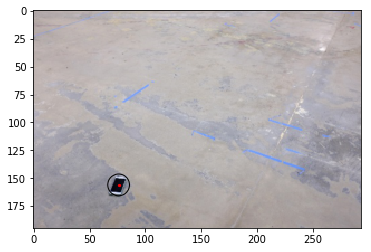

0.73866403 0.80366254


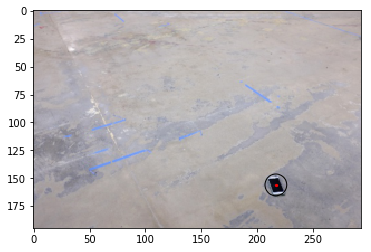

0.26126638 0.19628564


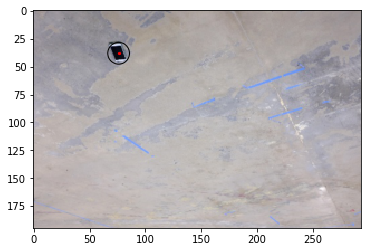

0.7388866 0.1962613


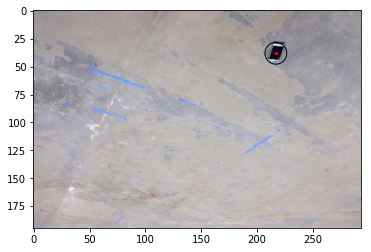

0.6551749 0.3465983


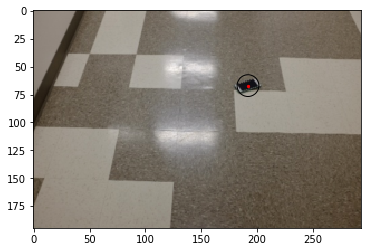

0.34471405 0.3465961


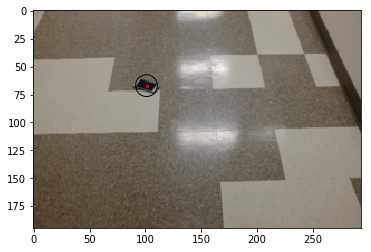

0.6550836 0.65338635


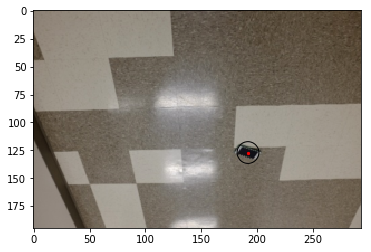

0.34485167 0.653407


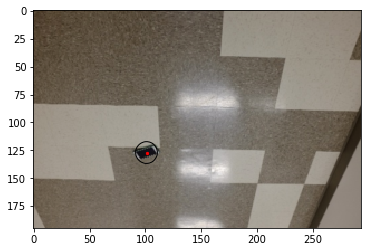

0.25486717 0.31284705


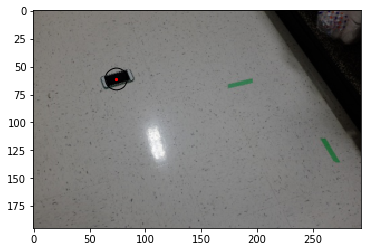

0.18781775 0.11031316


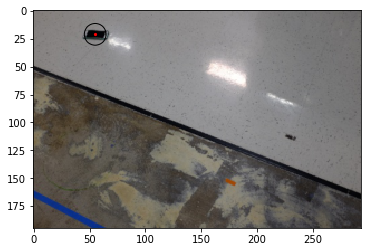

0.8121011 0.11043311


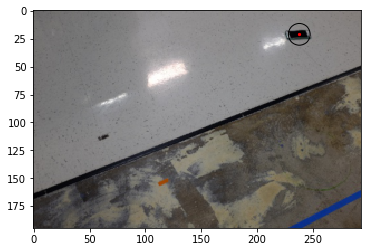

0.18783367 0.8895634


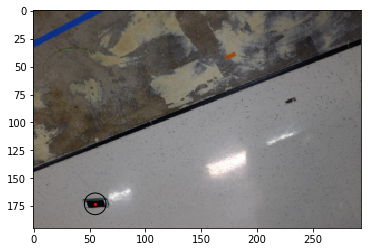

0.81206506 0.88960403


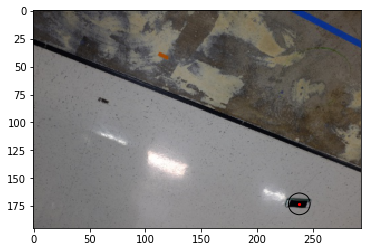

0.7835388 0.6503026


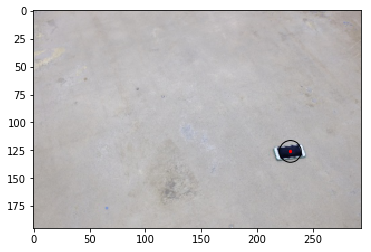

0.21607988 0.6503658


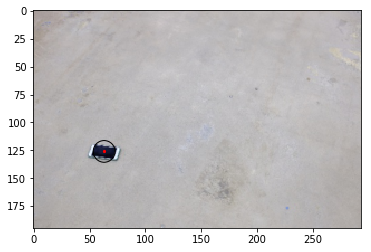

0.78371 0.34966594


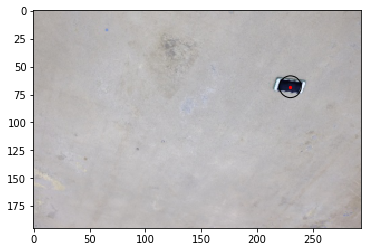

0.21626559 0.34965083


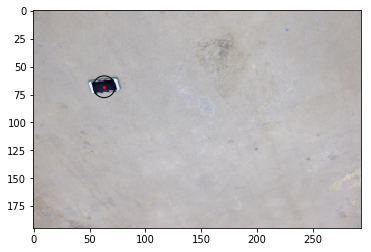

0.60194623 0.11341232


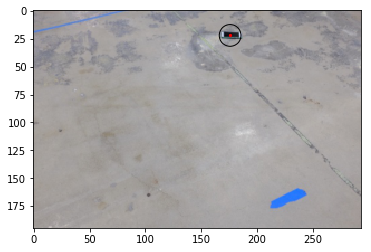

0.3979126 0.11348298


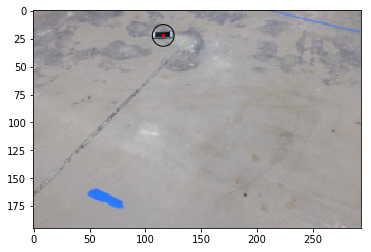

0.74533165 0.31263536


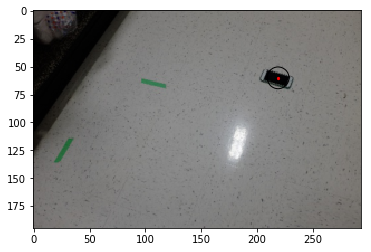

0.6018203 0.8864477


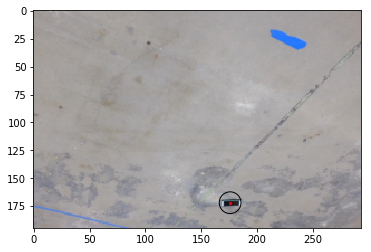

0.39795718 0.8864781


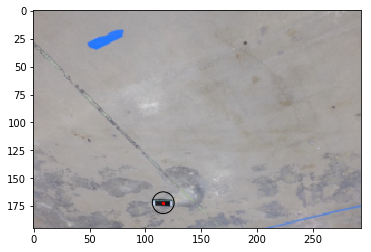

0.14901304 0.64409


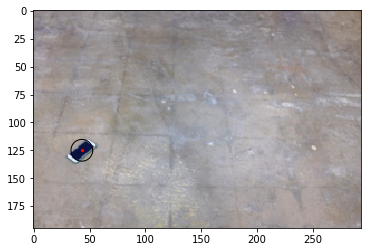

0.850901 0.64411384


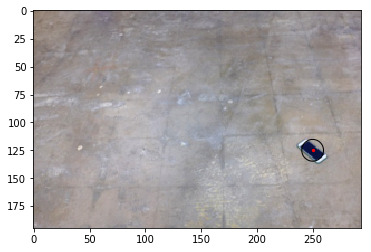

0.14901754 0.35576937


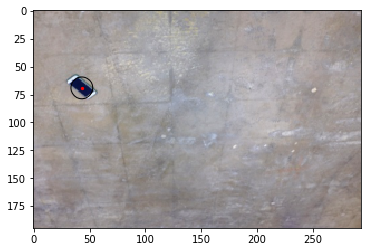

0.85089076 0.3557819


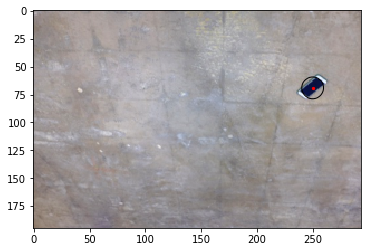

0.8059239 0.26974407


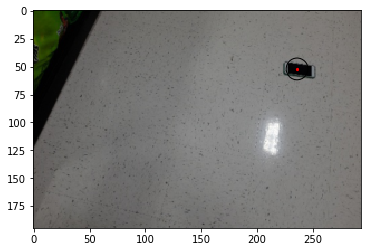

0.19373265 0.2698755


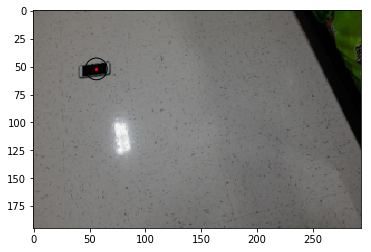

0.8063774 0.730047


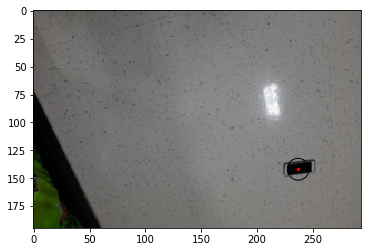

0.19381976 0.7301113


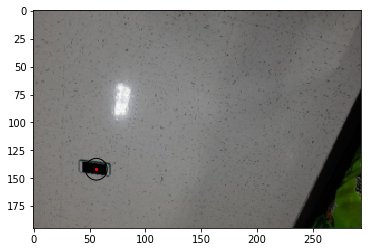

0.25495178 0.68723375


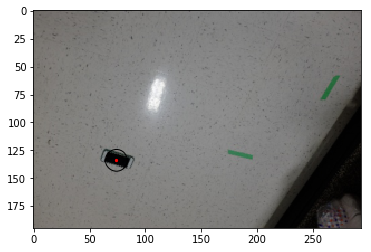

0.40823257 0.77911323


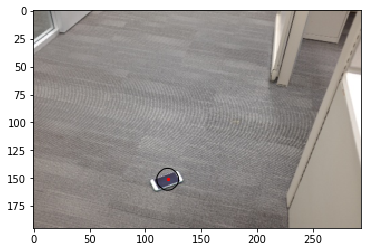

0.59172636 0.77907264


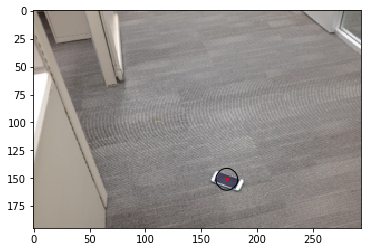

0.40819573 0.2208418


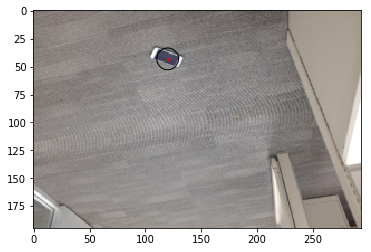

0.5916987 0.22088948


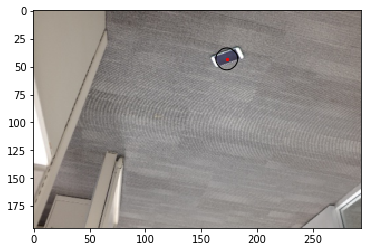

0.43279514 0.8405004


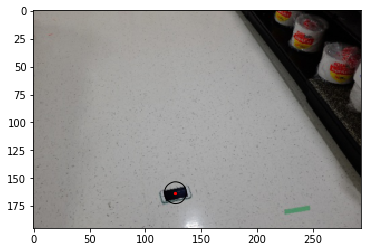

0.567127 0.8405886


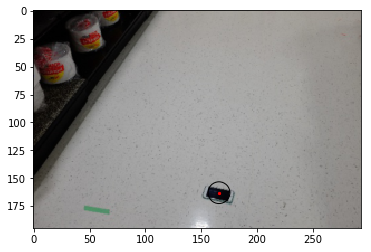

0.43268773 0.15941611


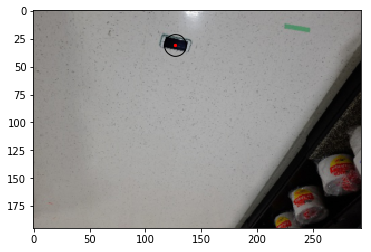

0.5671386 0.15942746


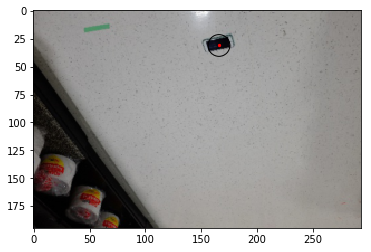

0.2285241 0.8711259


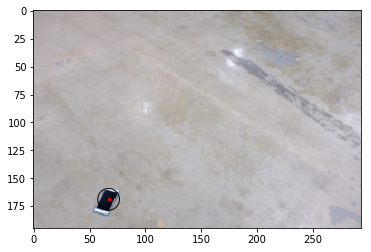

0.7713622 0.8711432


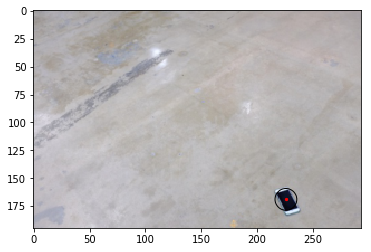

0.74525386 0.6872947


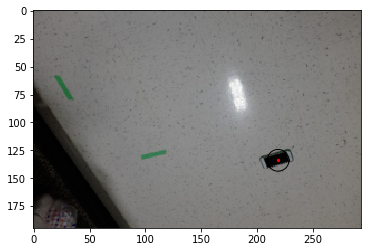

0.22853498 0.12874812


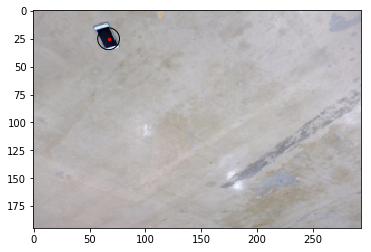

0.7713281 0.12875664


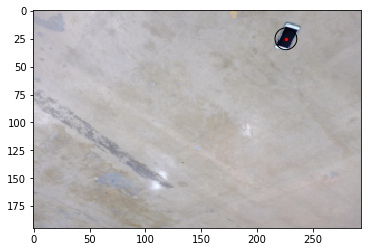

0.75686026 0.42640507


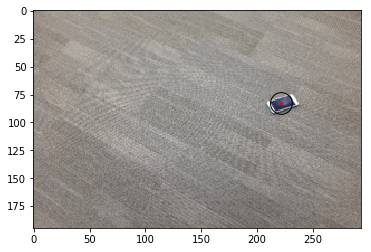

0.24286783 0.42637292


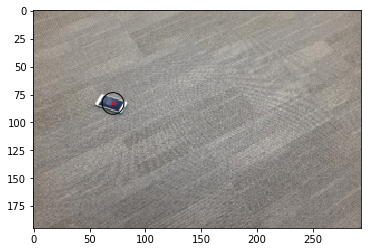

0.75705343 0.5735504


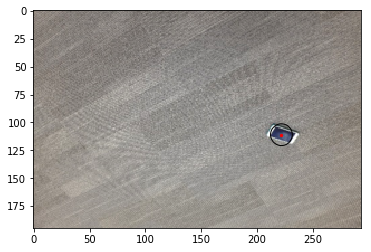

0.24282223 0.57358646


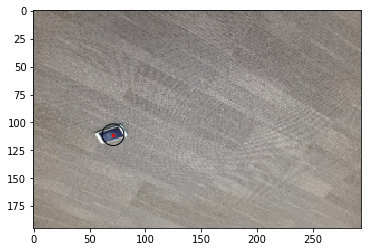

0.83658326 0.7147043


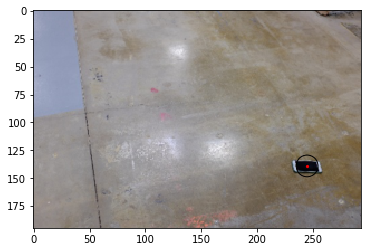

0.16334286 0.7146817


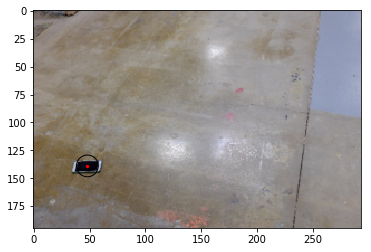

0.83666295 0.28533763


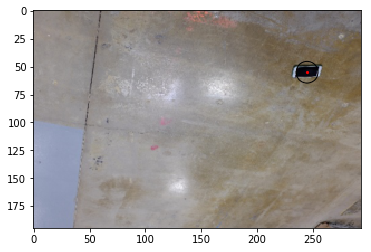

0.1633426 0.28528136


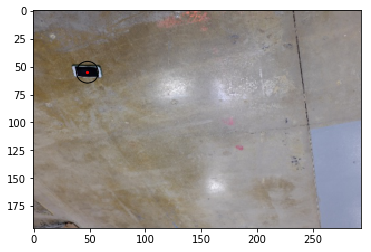

0.71215165 0.71176976


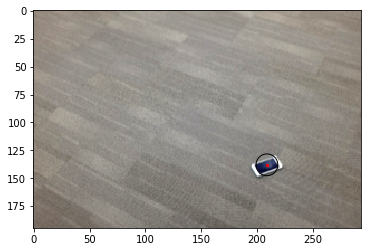

0.37139076 0.53068495


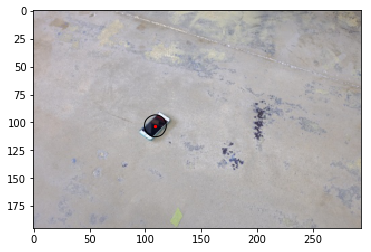

0.62852997 0.53059846


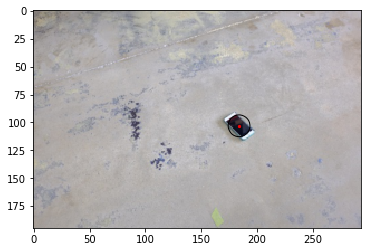

0.37138653 0.46927664


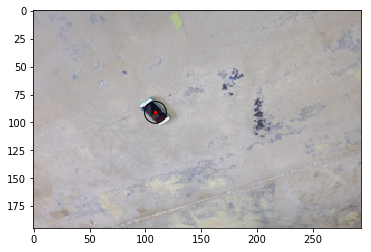

0.6285624 0.46922138


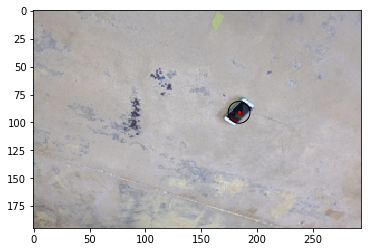

0.5981696 0.12575701


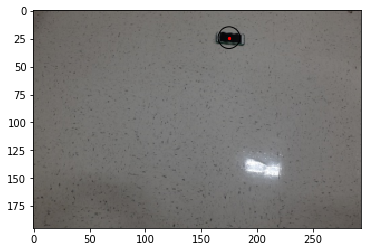

0.40194228 0.12573187


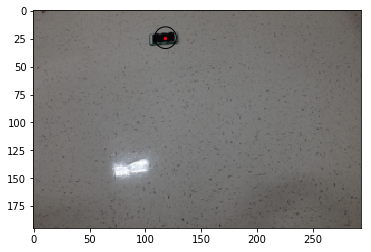

0.5980143 0.8742561


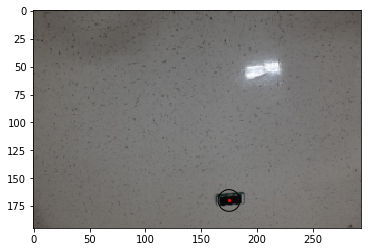

0.4020114 0.8742745


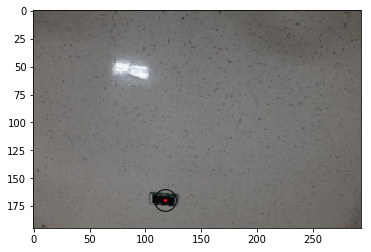

0.68351007 0.7485654


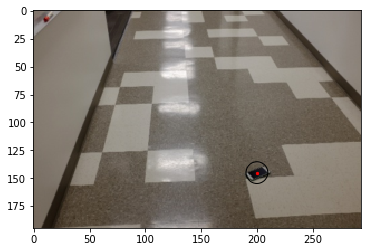

0.3163427 0.7485261


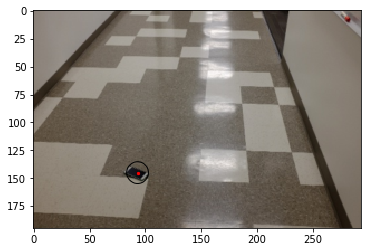

0.2877983 0.71179086


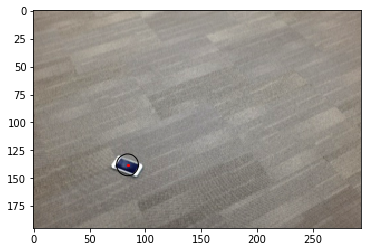

0.6836111 0.2515117


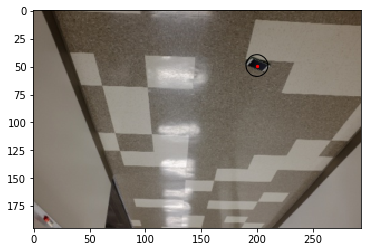

0.31640214 0.25144333


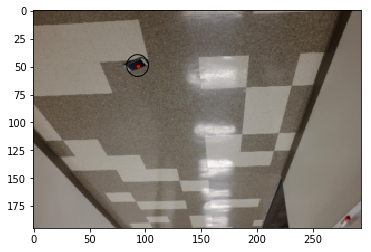

0.25299743 0.21162401


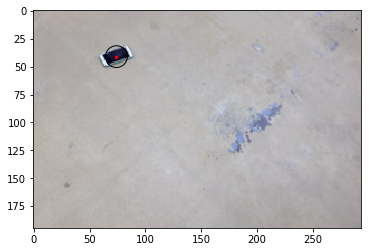

0.74690986 0.21171087


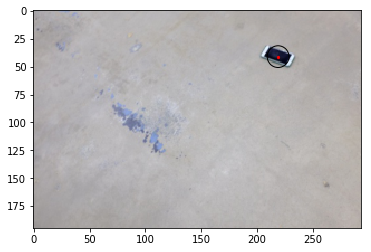

0.2532949 0.7882875


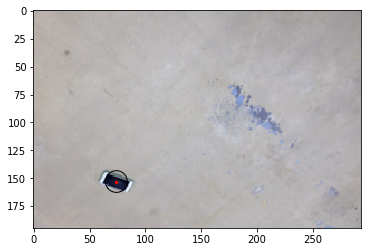

0.74693346 0.7883333


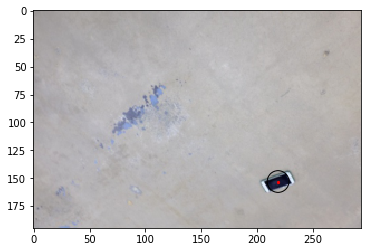

0.75510144 0.484752


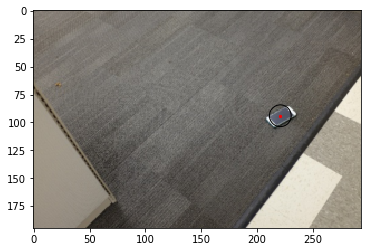

0.24490806 0.48468864


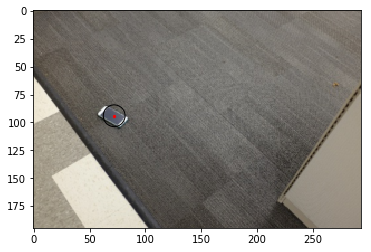

0.7550346 0.51530725


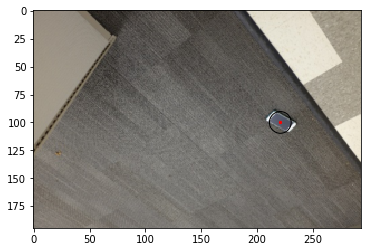

0.24490607 0.51524377


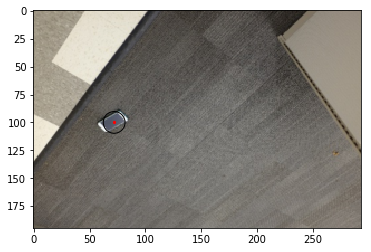

In [42]:
predictions = model.predict(augmented_validation_data_)

for i, pred in enumerate(predictions):
    print(str(pred[0]) + " " + str(pred[1]))
    
    plot_with_label(augmented_validation_data[i], pred[0], pred[1])
    

In [13]:
predictions = model.predict(augmented_validation_data_resized)

for i, pred in enumerate(predictions):
    print(str(pred[0]) + " " + str(pred[1]))
    
    plot_with_label(augmented_validation_data[i], pred[0], pred[1])

NameError: name 'augmented_validation_data_resized' is not defined